<a href="https://colab.research.google.com/github/ailton-moreira/dog-vision-ml/blob/main/dog_vison.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Unzip the data to google drive
#!unzip "/content/drive/MyDrive/Dog-Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog-Vision/"

# 🐶 Ent-to-end Multil-class Dog Breed Classification

This notebook builds an end-to-ed multi-class image classifier using using TensorFlow 2.0 aand TensowFlow Hub.

## 1. Problem

Identifyinng the bread of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

link: https://www.kaggle.com/competitions/dog-breed-identification/data


## 3. Evaluation

The evaluation is a file prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructures data) so it's probably best we use deep learning/transfer learning.
* There are 120 breed dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these image labels).
* There are around 10,000+ images in the test set (these images have no labels, because  we'll want to predict them).



# Get our workspace ready

* Import TensorFlow 2.x ✅
* Import Tensowflow Hub ✅
* Make sure we're using a GPU ✅

In [1]:
# import necessary tools
# import tensorflow into colab
import tensorflow as tf
import tensorflow_hub as hub

print("TF version: ", tf.__version__)
print("TF hub version: ", hub.__version__)

# Check for GPU availability
print("GPU", "available (YEEESSSSSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :'(")

TF version:  2.15.0
TF hub version:  0.16.1
GPU available (YEEESSSSSSS!!!!!)


## Getting our data ready (turning into TensorFlow)

With all machine learning models, our data has to be inn nnumerical format. So that's what we'll be doing first (numerical representations).

Let's start by accessing ou data and checking out the labels.

In [ ]:
# Loading data into colab
# Checkout the labels  of our data
import pandas as pd
import numpy as np

labels_csv = pd.read_csv("/content/drive/MyDrive/Dog-Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: >

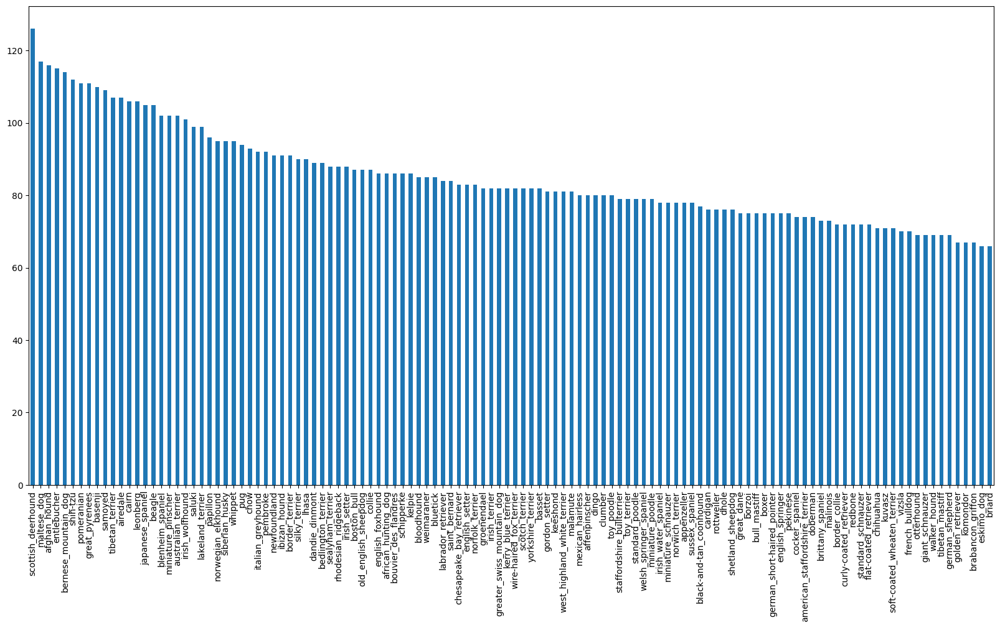

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

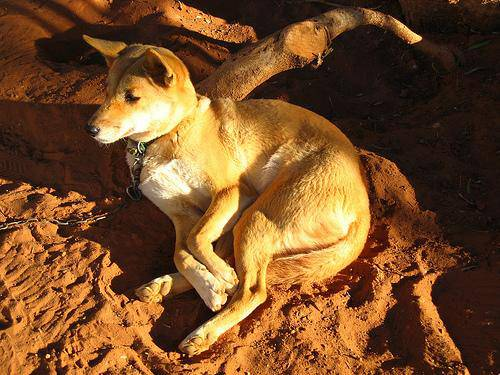

In [ ]:
# Let's view an image
from IPython.display import Image

Image("/content/drive/MyDrive/Dog-Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and thei labels

Let's get a list of all our images and pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from images ID's

filenames = ["/content/drive/MyDrive/Dog-Vision/train/"+fname + ".jpg" for fname in labels_csv["id"]]

filenames[:10]

['/content/drive/MyDrive/Dog-Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog-Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog-Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog-Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog-Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog-Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog-Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog-Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog-Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog-Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check wheter number of filenames matches number of actul image files
import os
if len(os.listdir("/content/drive/MyDrive/Dog-Vision/train/")) == len(filenames):
  print("Filename do match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filename do match actual amount of files!!! Proceed.


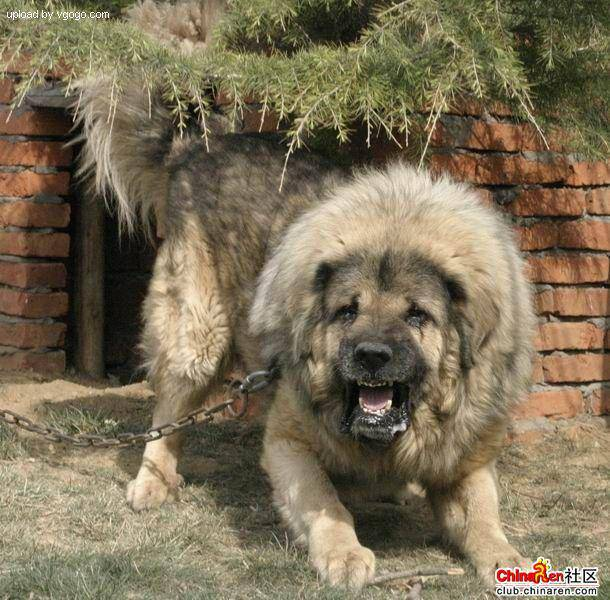

In [ ]:
# One more check
Image(filenames[9000])

Since we're now got our trianing image filepaths is a list, let's prepare our labels.

In [ ]:
labels_csv['breed'][9000]

'tibetan_mastiff'

In [ ]:
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the nnumber of fileanmes
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match, please check file directory!")

Number of labels matches number of filenames!


In [ ]:
# find the unique labels values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
unique_breeds


array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # Original label
print(np.where(unique_breeds == labels[0])) # inndex where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2]) # Original label
print(boolean_labels[2].astype(int)) # there will be a 1 where the sample label occurs

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creatinng our own validation set

Since the dataset from Kaggle doessn't come with a validation set, we're going to create our own.

In [ ]:
# Setup X & y variabless
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

We're going to staaart off experimenting with ~1000 iamges and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: "slider", min:1000, max:10000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training annd validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:5], y_train[:5]

(['/content/drive/MyDrive/Dog-Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog-Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog-Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog-Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog-Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

### Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're goinng to write a function which does a few things:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) innto Tensors
4. Resize the `image` to be a shape of (224, 224)
5. Return the modified `image`

Before we do, let's see what importing as image looks like

In [ ]:
# Convert an image to NumPy
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
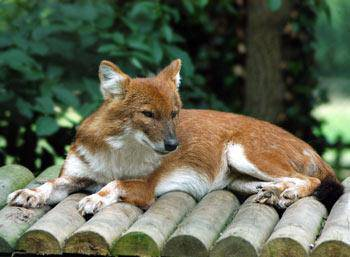

In [ ]:
image

In [ ]:
# Turn image into a Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

New we've seen what an image looks like as a Tensor, let's make a funcntion to preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) innto Tensors
4. Normalize our image (convert color channel  values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a funnction for preprocessisng images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the images into a Tensor.
  """

  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turnn the jpeg image into numerial Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel to values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32) ## NORMALIZATION PROCESS
  # Resize the image to our desired shape value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


## Turning our data into batches

Why turn our data into batches?

Let's ssay you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batches size) images at a time (you can manualy adjust the batche size if need be).

In order to use TensorFlow effectively, we need oour data int the form  of Tensor tuples which looks like this: `(images, label)`.

In [ ]:
# Create a simple function to return aa tuple (images, label)

def get_image_label(image_path, label):
  """
  Takes an image file path nanme and the associate label. processes the image and returns a tuple of (image, label)
  """
  image =  process_image(image_path)
  return image, label

In [ ]:
# Demo of above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn oour data into tuples of Tensors in the form `(images, label)`, let's make a funcntion to turn all of our data `(X, & y)` into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's trainning data but doesn't shuffle if it's validatio data.
  Also, accesspts test data as input (no labels).
  """
  # If the data is atest dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepath (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepath
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # if none previous fucntion work
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepath
                                               tf.constant(y))) # labels
    # Shuffling pathnames and labels before mapping image processor fuction is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a proprocessed image)
    data = data.map(get_image_label)

    # turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

    return data_batch



In [ ]:
# Creating training and vaalidation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val,  y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Checkout the differennt attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing data batches

Our data is now in batches, however these can be little hard to understannd/comprehend, let's visualized them

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in batch
def show_25_images(images, labels):
  """
  Display a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

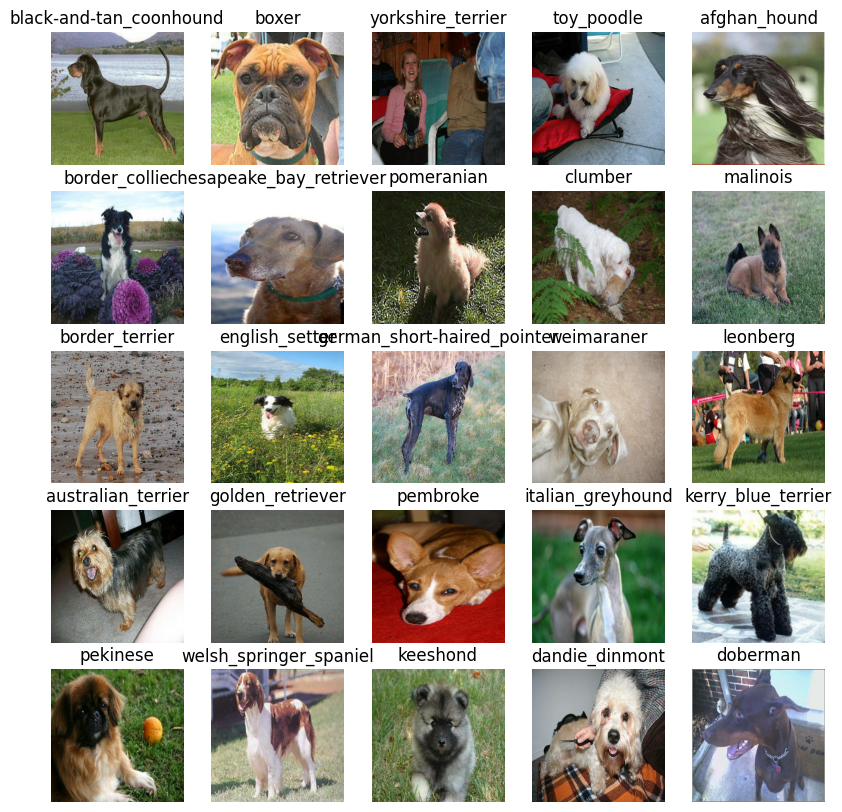

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())

# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

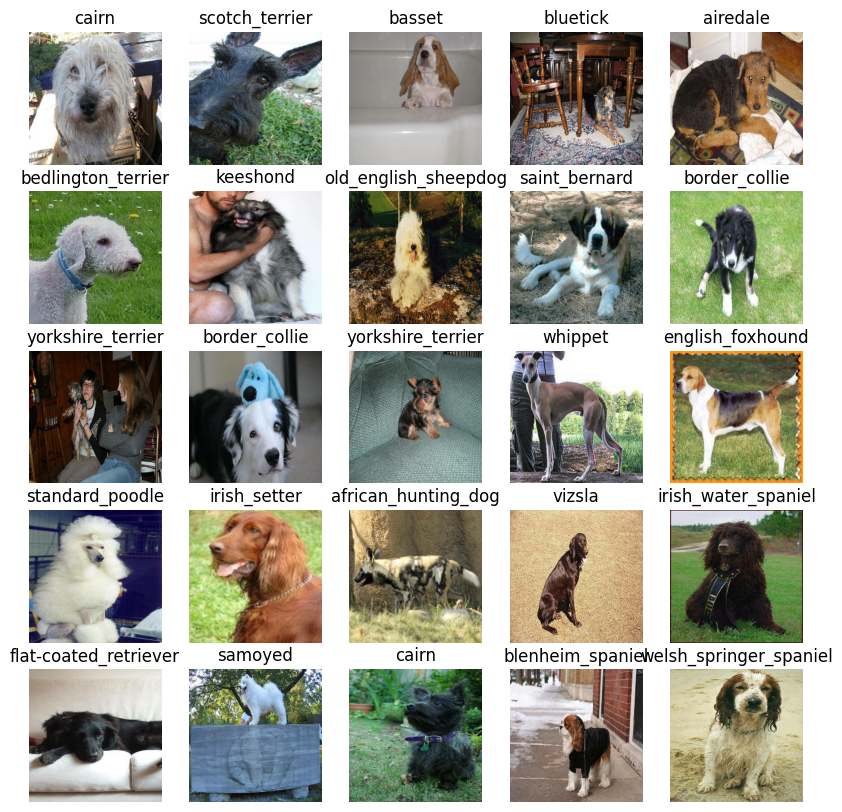

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())

# Now let's visualize the data in a validation batch
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are few things we need to define:
* The input shape (our images shape, in the for of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensowFlow Hub https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL =  "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/140-224-feature-vector/versions/2"

Now we've got our inputs, outputs, and model read to go. Let's put them together into a Keras deep learning model.

Knowing this, let's create a function which:
* Takes the input shape, output sahpe and the model we've chosen as parameters.
* Definess the layers in a Keras models in sequencial fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluatesd and improved).
* Build the model (tels the model the input hape it'll be getting).
* Return the model.

All of this spets can be foud here: https://www.tensorflow.org/guide/keras

In [ ]:
# Create a function which builds a Keras model

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model = create_model()
model.summary()

Building model with:  https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/140-224-feature-vector/versions/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1792)              4363712   
                                                                 
 dense (Dense)               (None, 120)               215160    
                                                                 
Total params: 4578872 (17.47 MB)
Trainable params: 215160 (840.47 KB)
Non-trainable params: 4363712 (16.65 MB)
_________________________________________________________________


## Creating callbacks

Callbacks aare helperss functions a model can use durinng training to do such thigs as save its progress, check its progress or stop training early if a model stops improving

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and it to our model's `fit()`function. ✅
3. Visualize our models training logs with the `%tensorfboard`magic function (we'll do this after model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard


In [ ]:
import datetime

# Create a funtion to build a TensorBoards callback
def create_tensorboard_callback():
  # Create a log directory for save the logs
  logdir = os.path.join("/content/drive/MyDrive/Dog-Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
                        )
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stoping callback

Early stoping helps stop our model from overfitting by stopping training if a certain evaluation metric stops

In [ ]:
# Create early stoping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working


In [ ]:
NUM_EPOCHS = 100 #@param {type: "slider", min:10, max:100, step:10}

In [ ]:

# Check for GPU availability
print("GPU", "available (YEEESSSSSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :'(")

GPU available (YEEESSSSSSS!!!!!)


Let's create a function which trains a model.
* Create a model using `create_model()`
* Setup a TensorBoard callback using `creating_tensorboard_callback()`
* Call the `fit()`functiuon on our model passing it the training data, validation data, number of epochss to train for (NUM_EPOCHS) and the callbackss we'd like to use
* Return the model

In [ ]:
# Build a function to train ad return a trainied model
def train_model():
  """
  Train a given model and return the trainned version.
  """
  # Create a model
  model = create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to eh data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with:  https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/140-224-feature-vector/versions/2
Epoch 1/100
25/25 [==============================] - 442s 18s/step - loss: 4.1402 - accuracy: 0.1713 - val_loss: 2.9359 - val_accuracy: 0.4200
Epoch 2/100
25/25 [==============================] - 7s 272ms/step - loss: 1.2955 - accuracy: 0.7987 - val_loss: 1.7977 - val_accuracy: 0.6050
Epoch 3/100
25/25 [==============================] - 10s 397ms/step - loss: 0.4591 - accuracy: 0.9575 - val_loss: 1.4107 - val_accuracy: 0.6750
Epoch 4/100
25/25 [==============================] - 6s 243ms/step - loss: 0.2300 - accuracy: 0.9900 - val_loss: 1.2904 - val_accuracy: 0.7000
Epoch 5/100
25/25 [==============================] - 8s 329ms/step - loss: 0.1442 - accuracy: 1.0000 - val_loss: 1.2305 - val_accuracy: 0.7200
Epoch 6/100
25/25 [==============================] - 4s 167ms/step - loss: 0.1016 - accuracy: 1.0000 - val_loss: 1.2061 - val_accuracy: 0.7250
E

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevents model overfitting in deep learning neural networks?

**Answer:**
Overfitting is a common challenge in deep learning neural networks, where the model learns to memorize the training data rather than generalize well to unseen data. Here are some techniques to prevent overfitting:

1. **Increase Data**: One of the most effective ways to combat overfitting is to increase the size of your training dataset. More diverse and representative data can help the model to learn more generalized patterns.

2. **Data Augmentation**: If getting more data is not feasible, you can artificially increase the size of your dataset through data augmentation techniques such as rotation, flipping, scaling, cropping, adding noise, etc. This helps in exposing the model to a wider variety of scenarios.

3. **Regularization Techniques**:
   - **L2 Regularization (Weight Decay)**: This adds a penalty term on the weights to the loss function, discouraging large weights and promoting a smoother decision boundary.
   - **L1 Regularization**: Similar to L2 regularization, but penalizes the absolute value of weights, leading to sparsity.
   - **Dropout**: Randomly deactivates a fraction of neurons during training, forcing the network to learn redundant representations, which prevents overfitting.
   - **Batch Normalization**: Normalizes the activations of each layer, helping to stabilize and speed up the training process. It can act as a regularizer by adding noise to the activations.
   - **Early Stopping**: Monitor the performance on a validation set during training and stop training when performance starts to degrade, indicating overfitting.

4. **Model Architecture Modifications**:
   - **Simplifying the Model**: Use simpler architectures or reduce the number of layers/neurons. Sometimes, a simpler model can generalize better.
   - **Add More Layers**: Sometimes, adding more layers can help, but it should be done cautiously, as it can lead to increased capacity and potential overfitting.
   - **Use Transfer Learning**: Utilize pre-trained models and fine-tune them on your specific task. Transfer learning leverages knowledge learned from a related task or domain, which can help prevent overfitting, especially when you have limited data.

5. **Cross-validation**: Instead of a single train-validation split, use techniques like k-fold cross-validation to better estimate the model's performance and ensure that it generalizes well to unseen data.

6. **Ensemble Methods**: Combine predictions from multiple models. This helps to reduce overfitting by capturing different aspects of the data and mitigating the risk of any single model memorizing noise.

7. **Feature Selection/Engineering**: Select relevant features and discard irrelevant or redundant ones. This reduces the complexity of the model and makes it less prone to overfitting.

By applying these techniques judiciously, you can mitigate overfitting and develop deep learning models that generalize well to unseen data.

**Note:** Overfitting to beginn with is a good thing! It means our model is learning!!

### Checking the tensorboard logs

The tensorboard magic function (`%tensorboard`) will accesss the logs directory we created earlier and visualize it contents.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Dog-Vision/logs

<IPython.core.display.Javascript object>

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

## Making and evaluating predictionns ussing a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)

predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 8s 114ms/step


array([[2.6323481e-03, 2.6346825e-04, 7.2537950e-04, ..., 2.2796024e-05,
        2.0517070e-04, 2.0438913e-04],
       [6.5968554e-03, 7.4299960e-04, 4.4735214e-03, ..., 3.2259692e-03,
        9.9829549e-04, 8.9150900e-04],
       [3.6433405e-06, 5.2735213e-05, 5.1873831e-05, ..., 2.2197803e-04,
        1.5853670e-05, 6.3237041e-04],
       ...,
       [2.0364158e-05, 1.2660061e-03, 2.3709853e-04, ..., 1.6639114e-04,
        2.4218878e-05, 3.8718988e-04],
       [3.8879711e-04, 4.1035051e-05, 1.3667045e-04, ..., 8.5283151e-05,
        3.4550991e-05, 1.7242578e-03],
       [4.1834079e-04, 1.1903993e-05, 1.4459471e-03, ..., 3.2606495e-03,
        7.2230987e-04, 1.8115736e-04]], dtype=float32)

In [ ]:
# First prediction
index = 42
print(predictions[0])
print(f"Max value (proabability of prediction): {np.max(predictions[index])}")
print(f"Sum:  {np.sum(predictions[index])}")
print(f"Max index {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.63234810e-03 2.63468246e-04 7.25379505e-04 4.87425859e-05
 2.00278824e-04 1.08998011e-05 7.07880128e-03 1.27895881e-04
 1.07879758e-04 2.20234760e-05 6.94951857e-04 1.09062545e-04
 8.68961524e-06 1.59143274e-05 4.06098334e-05 3.09473835e-05
 1.38415817e-05 5.25892712e-02 3.29605391e-05 6.99839484e-06
 1.00209820e-03 1.31291585e-04 7.65157893e-05 3.22398124e-03
 2.58430214e-06 1.87030091e-05 5.56585670e-01 8.15333187e-05
 6.77065575e-04 1.84369885e-04 1.38544914e-04 1.06654386e-03
 7.74683867e-05 8.54685932e-05 1.41044176e-04 2.08422691e-02
 7.16163559e-05 7.20053431e-05 1.45065724e-05 2.58366390e-06
 5.16176515e-04 2.94491765e-05 4.68341277e-05 2.84308917e-05
 2.72460366e-05 1.04879415e-04 8.29602322e-06 1.01803096e-04
 7.33746681e-04 8.93083707e-05 6.21861909e-05 1.38546107e-04
 8.67635070e-04 4.91836863e-06 1.32186542e-05 2.22325093e-06
 5.36231573e-06 2.16782722e-03 3.74821029e-05 1.47298634e-01
 3.78676923e-05 1.08464565e-06 1.54905918e-03 2.09570881e-05
 2.22619256e-05 1.076777

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image prediction is being made on!

**Note:** Prediction probabilities are know  as confidence levels

In [ ]:
# Turn predictions probabilities into theeir respectives label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns a array of predictions probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

In [ ]:
  # Get a predicted label based on an array of prediction probabilities
  pred_label = get_pred_label(predictions[42])
  pred_label

'english_foxhound'

Now since our vaalidation data is still i a batch dataset, we'll have to unbatchify it to make predctions on the validation images and then compare those predictions to the validations labels (truth labels).

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (images, label) Tensors ad returns a separate arrays of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

In [ ]:
  # Unbaatchify the validation data
  val_images, val_labels = unbatchify(val_data)
  val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
images_ = []
labels_ = []


# loop through unbatch data
for  image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0]
labels_[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

Now we've got ways to get:
* Prediction labels
* Validationn labels (truth labels)
* Validatiion images

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Takes an array of predictions probabilities, an array of truth labels and an array of images and integers ✅
* Convert the prediction probabilities to a predicted label ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot ✅

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the predcition, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove tick
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediciton is right or worng
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction an truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
  color=color)

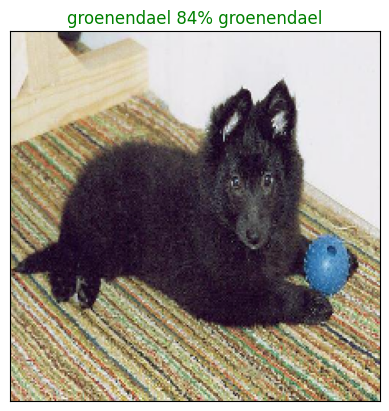

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images, n=77)

Now we've got on funtion to visulize our models top predictions, let's make onother to view our models top  10 predicitons.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediction using `get_pred_label()` ✅
* Find the top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediciton labels ✅
* Plot the top 10 prediciton probability values and labels, coloring the true label green ✅

In [ ]:
def plot_pred_conf(prediciton_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediciton_probabilities[n], labels[n]

   # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1] # Get top 10, reverse order in array

  # Find the top 10 predictions confidence value
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 predictions labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation="vertical")

  # change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

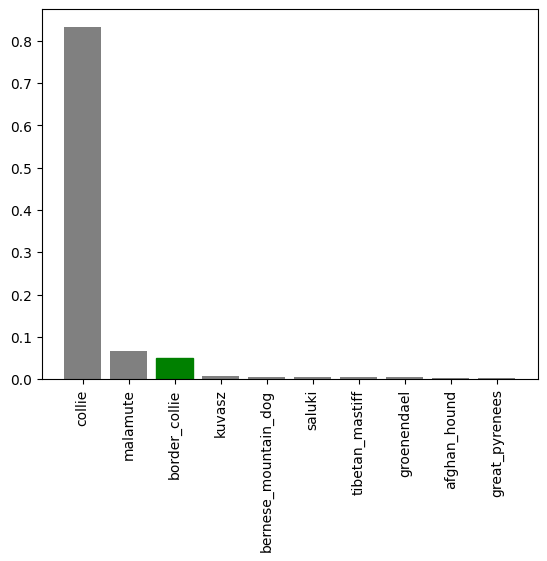

In [ ]:
plot_pred_conf(prediciton_probabilities=predictions, labels=val_labels, n=9)

Now we've got some function to help us visualize our predictions and evaluate our model, let's chek out our

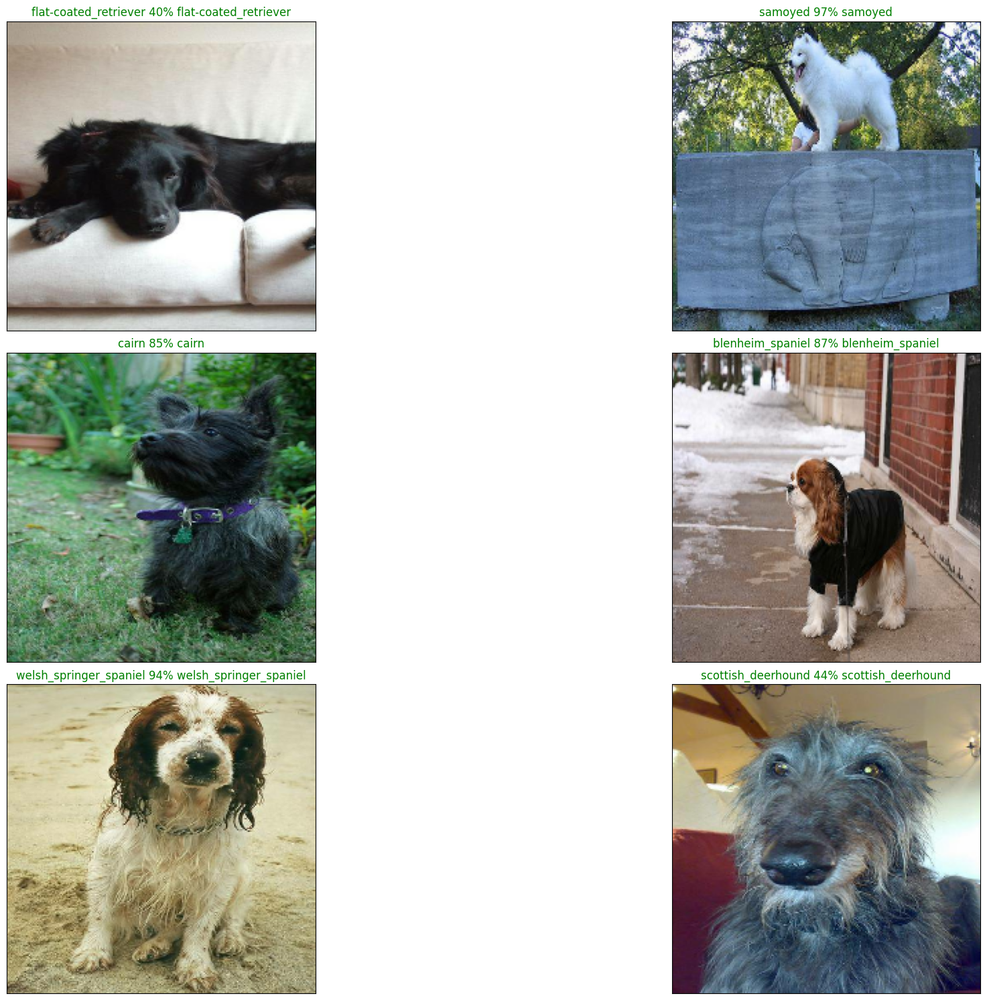

In [ ]:
# Let's check out a few predcitions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()